<a href="https://colab.research.google.com/github/Shubham724Rana/MRI_Tumor_Detection/blob/main/MRI_Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **# Check current location, '/content/drive/MyDrive/Kaggle'**
Enable the Kaggle environment, use the path to the directory your Kaggle API JSON is stored in


In [1]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/Kaggle'


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Installing Kaggle

In [ ]:
!pip install kaggle

# Changing Directory In Drive


In [4]:
os.chdir('/content/drive/MyDrive/Kaggle/Brain MRI Segmentation')


# Downloading The Data Set From Kaggle To Drive

In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

 99% 707M/714M [00:04<00:00, 177MB/s]
100% 714M/714M [00:04<00:00, 169MB/s]


#Unzipe the file

In [ ]:
#unzipe the file
!unzip \*.zip && rm *.zip

Archive:  lgg-mri-segmentation.zip
replace kaggle_3m/README.md? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Importing Libraries

In [5]:
import pandas as pd
import numpy as np
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from  keras.preprocessing.image import ImageDataGenerator
from skimage import img_as_float
from skimage.metrics import peak_signal_noise_ratio
from skimage import io
from scipy import ndimage as nd

In [ ]:
tf.__version__

'2.5.0'

In [6]:
dataset = "/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m"

dirs = []
images = []
masks = []
for directory, _, filenames in os.walk(dataset):
    for filename in filenames:
        if 'mask'in filename:
            dirs.append(directory .replace(dataset, ''))
            masks.append(filename)
            images.append(filename.replace('_mask', ''))


In [8]:
path_to_directory = pd.DataFrame(data={'directory':dirs, 'images': images, 'masks': masks})

In [9]:
path_to_directory.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   directory  3929 non-null   object
 1   images     3929 non-null   object
 2   masks      3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


# MRI Image (Tried on Just One Image without mask)

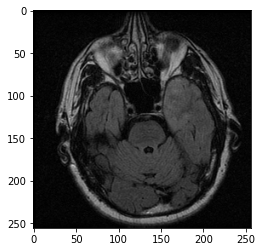

In [10]:
index = np.random.randint(0, len(path_to_directory))
imagePath = "/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/"+os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['images'].iloc[index])
image = (cv.imread(imagePath))
plt.imshow(image)


In [ ]:
def MRI_Image_Mask():
    index = np.random.randint(0, len(path_to_directory))
    
    imagePath =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['images'].iloc[index])
    maskPath = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['masks'].iloc[index])
    image = (cv.imread(imagePath))
    mask = (cv.imread(maskPath))

    fig, axs = plt.subplots(1,3, figsize=[13,15])
    axs[0].imshow(image)
    axs[0].set_title('Brain MRI')
    
    axs[1].imshow(mask)
    axs[1].set_title('Mask')
    
    axs[2].imshow(image)
    axs[2].imshow(mask, alpha=0.3)
    axs[2].set_title('MRI with mask')
    
    plt.grid(False)
    plt.show()


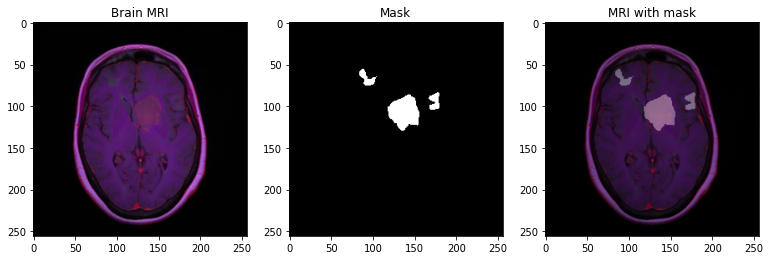

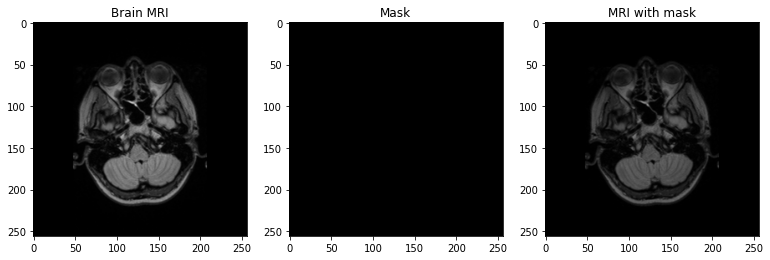

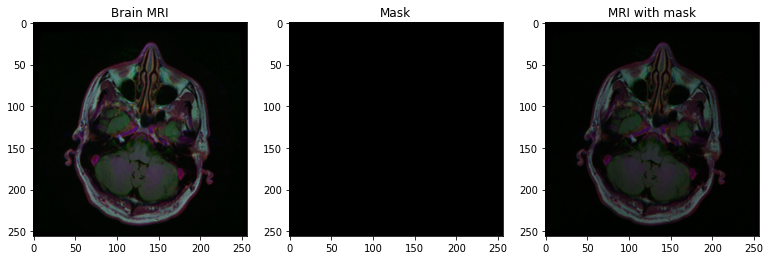

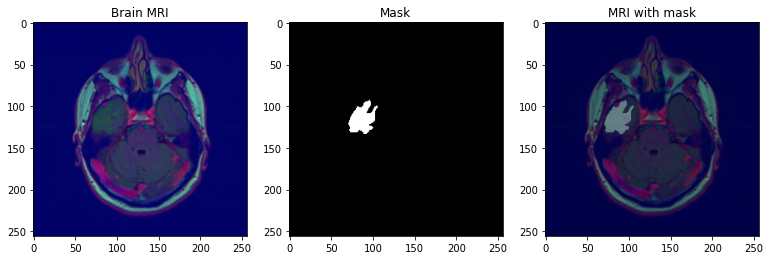

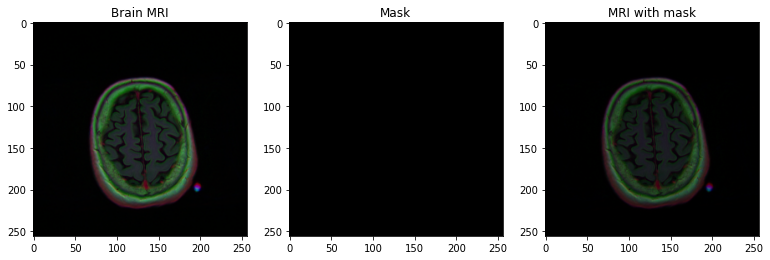

...

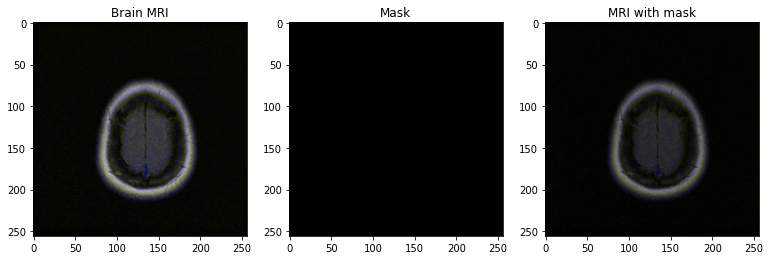

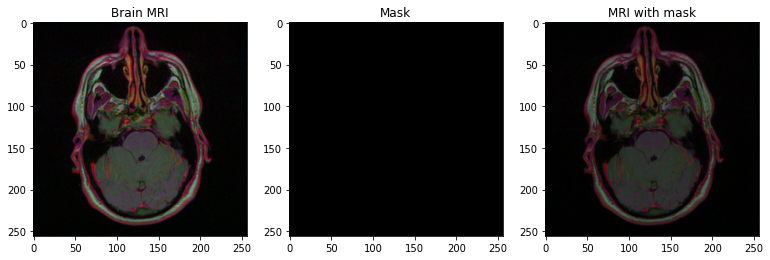

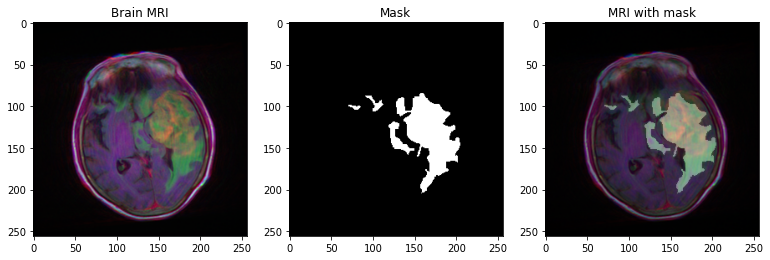

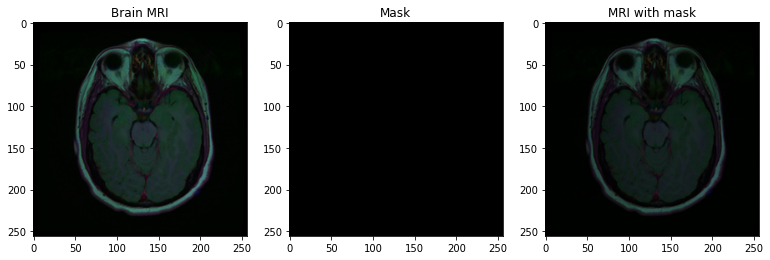

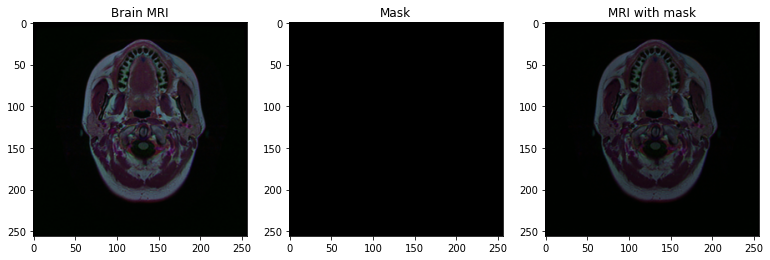

In [ ]:
for i in range(100):
  MRI_Image_Mask()

In [ ]:
def noise_comparison(ref_image, denoise_image):
  noise_psnr = peak_signal_noise_ratio(ref_image, denoise_image)
  gaussian_cleaned_psnr = peak_signal_noise_ratio(ref_image, denoise_image)
  print("PSNR of Images", gaussian_cleaned_psnr)
  print('\n')


# Denoising MRI Images (on a single image) 


### Using Gaussian filter

In [ ]:
def Gaussian_Denoising():
  index =1778
  print(index)
  imagePath =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['images'].iloc[index])
  maskPath = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['masks'].iloc[index])
  image = (cv.imread(imagePath))
  mask = (cv.imread(maskPath))
#Using Gaussian Filter From scipy ndimage and cv2.gaussian filter
  #gaussian_image = nd.gaussian_filter(image , sigma = 1)
  gaussian_image = cv.GaussianBlur(image, (3,3), cv.BORDER_DEFAULT)
  fig, axs = plt.subplots(1,2, figsize=[13,15])
  axs[0].imshow(image)
  axs[0].set_title('Brain MRI Normal')
  axs[1].imshow(gaussian_image)
  axs[1].set_title('Brain MRI Gaussian')
  noise_comparison(image, gaussian_image)
  #plt.subplot(121),plt.imshow(image),plt.title('Original')
  #plt.subplot(122),plt.imshow(gaussian_image),plt.title('Averaging')
  #plt.xticks([]), plt.yticks([])
  #plt.show()
  #plt.imshow("Gaussian Image", gaussian_image)
  #plt.imsave("/content/drive/MyDrive/Kaggle/Modified  MRI Data Base"+imagePath, gaussian_image, cmap = 'gray')



1778
PSNR of Images 38.395281289886526




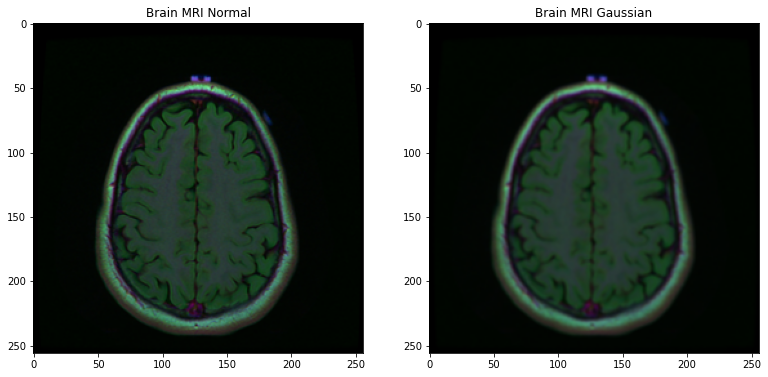

In [ ]:
Gaussian_Denoising()

## Using Bilateral Filter

In [ ]:
def Bilateral_Denoising():
  index = 1778
  imagePath =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['images'].iloc[index])
  maskPath = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['masks'].iloc[index])
  image = (cv.imread(imagePath))
  mask = (cv.imread(maskPath))
#Using Gaussian Filter  cv2.bilateralFilter()
  bilateral_image = cv.bilateralFilter(image,8,60,60)
  fig, axs = plt.subplots(1,2, figsize=[13,15])
  axs[0].imshow(image)
  axs[0].set_title('Brain MRI Normal')
  axs[1].imshow(bilateral_image)
  axs[1].set_title('Brain MRI Bilateral')
  noise_comparison(image, bilateral_image)

PSNR of Images 35.93382956442446




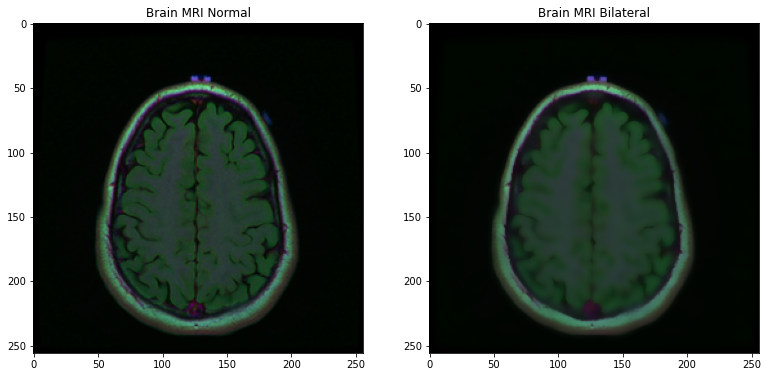

In [ ]:
Bilateral_Denoising()

## Using Anisotropic Diffusion 

In [ ]:
!pip install medpy

     |████████████████████████████████| 153kB 7.5MB/s 
     |████████████████████████████████| 47.4MB 69kB/s 
  Created wheel for medpy: filename=MedPy-0.4.0-cp37-cp37m-linux_x86_64.whl size=754470 sha256=473948315b8dff0ef0a1196913bfa617f4d1764ab8281f02d28d3abf36fa14ce
  Stored in directory: /root/.cache/pip/wheels/8c/c9/9c/2c6281c7a72b9fb1570862a4f028af7ce38405008354fbf870
Successfully built medpy


In [ ]:
from medpy.filter.smoothing import anisotropic_diffusion

In [ ]:
def Anisotropic_diffusion():
  index = 1778
  imagePath =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['images'].iloc[index])
  maskPath = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/' + os.path.join(dataset, path_to_directory['directory'].iloc[index], path_to_directory['masks'].iloc[index])
  image = img_as_float(io.imread(imagePath,as_gray = True))
  mask = (cv.imread(maskPath))
#Using Anisotropic Diffusion
  img = np.random.uniform(size=(32,32))
  img_filtered = anisotropic_diffusion(image, niter= 50, kappa= 50, gamma= 0.015, option= 2)
  fig, axs = plt.subplots(1,2, figsize=[13,15])
  axs[0].imshow(image)
  axs[0].set_title('Brain MRI Normal')
  axs[1].imshow(img_filtered)
  axs[1].set_title('Brain Anisotropic Diffusion')
  noise_comparison(image, img_filtered)

/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.7/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: Us

PSNR of Images 35.558517932103136




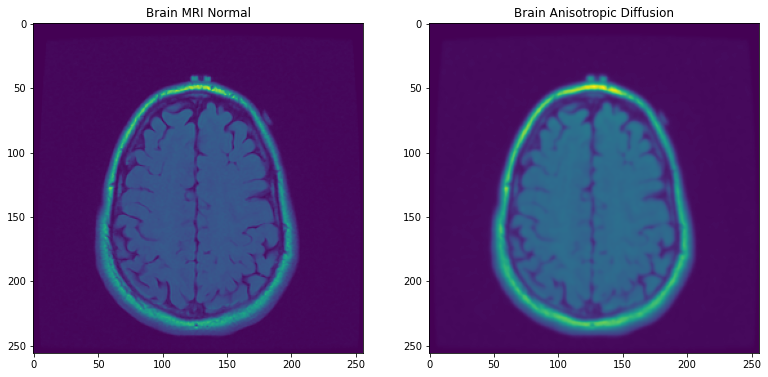

In [ ]:
 Anisotropic_diffusion()

# **Images Shape And Size**

In [ ]:
def imageShapeSize():   
    index = np.random.randint(0, len(image_mask_dataframe))  
    imagePath =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Train, Test, Validation/train' + os.path.join(train_dataset, image_mask_dataframe['directory'].iloc[index], image_mask_dataframe['images'].iloc[index])
    maskPath = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Train, Test, Validation/train' + os.path.join(train_dataset, image_mask_dataframe['directory'].iloc[index], image_mask_dataframe['masks'].iloc[index])
    img = cv.imread(imagePath)
    msk = cv.imread(maskPath)
    height, width, channels = img.shape
    # height, width, number of channels in image
    print('Image Height      : ',height)
    print('Image Width        : ',width)



In [8]:
imageShapeSize()

NameError: ignored

# Data Preprocessing

In [11]:
path_to_directory.describe() #rechecking the dataframe


,directory,images,masks
count,3929,3929,3929
unique,110,3929,3929
top,/TCGA_HT_A61B_19991127,TCGA_DU_A5TY_19970709_27.tif,TCGA_DU_5872_19950223_26_mask.tif
freq,88,1,1


# Adding the complete path for the images and masks

In [12]:
path_to_directory["imagePath"] = '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m' + path_to_directory["directory"] +'/' + path_to_directory["images"]
path_to_directory["maskPath"] =  '/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m' + path_to_directory["directory"] +'/'+ path_to_directory["masks"]

# Data Frame to .csv File

In [13]:
path_to_directory.to_csv('MRI_Images_Masks_Paths).csv', encoding='utf-8')

In [12]:
!cp MRI_Images_Masks_Paths.csv "/content/drive/MyDrive/Kaggle/Brain MRI Segmentation"

cp: cannot stat 'MRI_Images_Masks_Paths.csv': No such file or directory


In [14]:
path_to_directory.head()

,directory,images,masks,imagePath,maskPath
0,/TCGA_CS_4941_19960909,TCGA_CS_4941_19960909_11.tif,TCGA_CS_4941_19960909_11_mask.tif,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
1,/TCGA_CS_4941_19960909,TCGA_CS_4941_19960909_10.tif,TCGA_CS_4941_19960909_10_mask.tif,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
2,/TCGA_CS_4941_19960909,TCGA_CS_4941_19960909_13.tif,TCGA_CS_4941_19960909_13_mask.tif,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
3,/TCGA_CS_4941_19960909,TCGA_CS_4941_19960909_12.tif,TCGA_CS_4941_19960909_12_mask.tif,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
4,/TCGA_CS_4941_19960909,TCGA_CS_4941_19960909_14.tif,TCGA_CS_4941_19960909_14_mask.tif,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...


In [15]:
len(path_to_directory) #number of elements in directory


3929

# paths_df only cantain complete paths of images and masks

In [17]:
paths_df = path_to_directory.iloc[:,3:5]

In [19]:
paths_df #data frame

,imagePath,maskPath
0,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
1,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
2,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
3,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
4,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
...,...,...
3924,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
3925,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
3926,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...
3927,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...,/content/drive/MyDrive/Kaggle/Brain MRI Segmen...


# Spliting the data using train test split 

In [68]:
from sklearn.model_selection import train_test_split
train_df , test_df = train_test_split(paths_df, test_size=0.1, random_state=0)

In [69]:
train_df, test_df

(                                              imagePath                                           maskPath
 2522  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 196   /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 2270  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 2976  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 2494  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 ...                                                 ...                                                ...
 835   /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 3264  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...  /content/drive/MyDrive/Kaggle/Brain MRI Segmen...
 1653  /content/drive/MyDriv

In [22]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

In [ ]:
X_train = np.zeros((len(train), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype= np.uint8)
Y_train = np.zeros

# Data Generator (Augmentation) Keras Img Generator


In [24]:
data_augmentation_parameter = dict(featurewise_center=True,
                        featurewise_std_normalization=True,
                        rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')

# **Training**  From Keras

In [25]:
# image generator
imagegen = ImageDataGenerator(rescale=1./255.) #**data_augmentation_parameter)
maskgen = ImageDataGenerator(rescale=1./255.)#**data_augmentation_parameter)

In [34]:
# train generator
timage_generator=imagegen.flow_from_dataframe(dataframe=train_df,
                                            x_col="imagePath",
                                            batch_size= 32,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(256,256),
                                            color_mode='rgb')
# validation data generator
tmask_generator=maskgen.flow_from_dataframe(dataframe=train_df,
                                            x_col="maskPath",
                                            batch_size=32,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(256,256),
                                            color_mode='grayscale') 

Found 3536 validated image filenames.
Found 3536 validated image filenames.


# Validation Part (here we don't need augmentation)

In [35]:
# image generator
imagegen = ImageDataGenerator(rescale=1./255.)
maskgen = ImageDataGenerator(rescale=1./255.)


# train generator
vimage_generator=imagegen.flow_from_dataframe(dataframe=test_df,
                                            x_col="imagePath",
                                            batch_size= 32,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(256,256),
                                            color_mode='rgb')
# validation data generator
vmask_generator=maskgen.flow_from_dataframe(dataframe=test_df,
                                            x_col="maskPath",
                                            batch_size=32,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(256,256),
                                            color_mode='grayscale')  

Found 393 validated image filenames.
Found 393 validated image filenames.


In [36]:
def data_iterator(image_gen, mask_gen):
    for img, mask in zip(image_gen, mask_gen):
        yield img, mask

In [38]:
train_gen = data_iterator(timage_generator, tmask_generator)
valid_gen = data_iterator(vimage_generator, vmask_generator)

In [39]:
train_gen, valid_gen

(<generator object data_iterator at 0x7f86fbf40bd0>,
 <generator object data_iterator at 0x7f8704b9aed0>)

# Method For Image Augmnetation

In [31]:
def train_generator(data_frame, batch_size, aug_dict,
        image_color_mode="rgb",
        mask_color_mode="grayscale",
        image_save_prefix="image",
        mask_save_prefix="mask",
        save_to_dir=None,
        target_size=(256,256),
        seed=42):
    
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    
    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "imagePath",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "maskPath",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    
    train_gen = zip(image_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img, mask)
    
        
def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)
 

In [32]:
train_gen = train_generator(train_df, 32, data_augmentation_parameter)

In [33]:
train_gen


<generator object train_generator at 0x7f86fbf3fdd0>

# Image Segmentation using U-Net

In [40]:
import tensorflow as  tf
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.optimizers import Adam
from keras.metrics import MeanIoU

# **Simple Unet Model Trained Model 1**

In [41]:
#lets define image dimensions
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

In [ ]:
def simple_unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    kernel_initializer =  'he_uniform'  # also try 'he_normal' but model not converging... 
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c9)
     
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(lr = 1e-3), loss='binary_crossentropy', metrics=['accuracy'])
    #model.compile(optimizer=Adam(lr = 1e-3), loss='binary_crossentropy', metrics=[MeanIoU(num_classes=2)])
    model.summary()
    
    return model

In [57]:
model = simple_unet_model(256, 256, 3)
model.compile(optimizer= 'adam', loss="binary_crossentropy", metrics=["accuracy"])

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_76 (Conv2D)              (None, 256, 256, 16) 448         input_5[0][0]                    
__________________________________________________________________________________________________
dropout_36 (Dropout)            (None, 256, 256, 16) 0           conv2d_76[0][0]                  
__________________________________________________________________________________________________
conv2d_77 (Conv2D)              (None, 256, 256, 16) 2320        dropout_36[0][0]                 
____________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [58]:
#model check point
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_MRI.h5',verbose= 1, save_best_only= True)
#classback
callbacks = [tf.keras.callbacks.EarlyStopping(patience= 2, monitor= 'val_loss'),
             tf.keras.callbacks.TensorBoard(log_dir= 'logs')]

In [59]:
STEP_SIZE_TRAIN = timage_generator.n/20
STEP_SIZE_VALID = vimage_generator.n/20

In [60]:
results = model.fit(train_gen,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    batch_size= 6,
                    epochs=25,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                   validation_steps=STEP_SIZE_VALID)

Epoch 1/25
176/176 [==============================] - 2377s 13s/step - loss: 0.1141 - accuracy: 0.9667 - val_loss: 0.0256 - val_accuracy: 0.9926
Epoch 2/25
176/176 [==============================] - 51s 290ms/step - loss: 0.0256 - accuracy: 0.9924 - val_loss: 0.0214 - val_accuracy: 0.9932
Epoch 3/25
176/176 [==============================] - 53s 299ms/step - loss: 0.0245 - accuracy: 0.9925 - val_loss: 0.0201 - val_accuracy: 0.9940
Epoch 4/25
176/176 [==============================] - 53s 303ms/step - loss: 0.0217 - accuracy: 0.9933 - val_loss: 0.0193 - val_accuracy: 0.9933
Epoch 5/25
176/176 [==============================] - 54s 306ms/step - loss: 0.0192 - accuracy: 0.9938 - val_loss: 0.0145 - val_accuracy: 0.9952
Epoch 6/25
176/176 [==============================] - 54s 307ms/step - loss: 0.0144 - accuracy: 0.9950 - val_loss: 0.0126 - val_accuracy: 0.9957
Epoch 7/25
176/176 [==============================] - 54s 308ms/step - loss: 0.0123 - accuracy: 0.9956 - val_loss: 0.0125 - val_ac

# Saving Model

In [61]:
model.save("/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Saved Model/MRI_IS_Model_1.h5")

# Testing Trained Model 1 (model predictions)




In [63]:
#Random index
import random
index = random.randint(0, len(test_df))

image_train = tf.keras.preprocessing.image.load_img(train_df['imagePath'][index])
input_arr_train = tf.keras.preprocessing.image.img_to_array(image)
input_arr_train = np.array([input_arr])  # Convert single image to a batch.
predictions_train = model.predict(input_arr)

In [71]:
image_test = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Train, Test, Validation/val/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_12.tif')
input_arr_test = tf.keras.preprocessing.image.img_to_array(image)
input_arr_test = np.array([input_arr])  # Convert single image to a batch.
predictions_test = model.predict(input_arr)

In [73]:
preds_train = (predictions_train > 0.5).astype(np.uint8)
preds_test = (predictions_test > 0.5).astype(np.uint8)

# Perform a sanity check on some random images

In [75]:
# load the best model
model.load_weights('/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Saved Model/MRI_IS_Model_1.h5')

In [77]:
eval_results = model.evaluate(valid_gen, steps=STEP_SIZE_VALID, verbose=1)

19/19 [==============================] - 3s 137ms/step - loss: 0.0080 - accuracy: 0.9973


In [103]:
DataPath = "/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m"


In [107]:
idx = np.random.randint(0, len(path_to_directory))
imagePath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['images'].iloc[idx])
maskPath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['masks'].iloc[idx])

In [108]:
imagePath

'/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m/TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_15.tif'

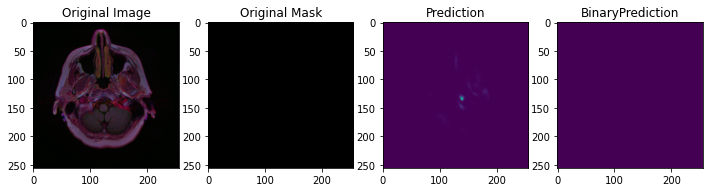

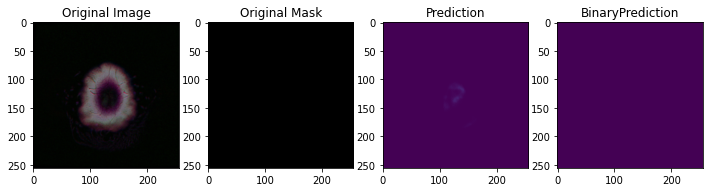

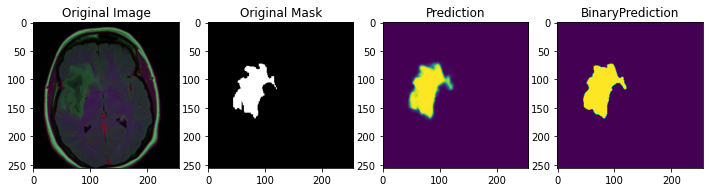

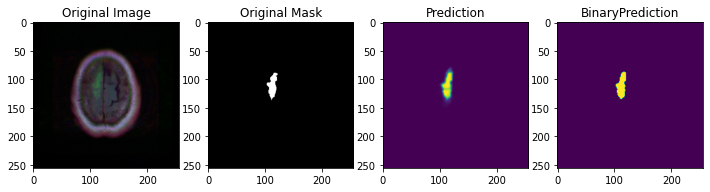

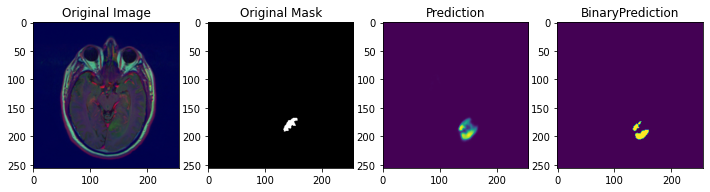

...

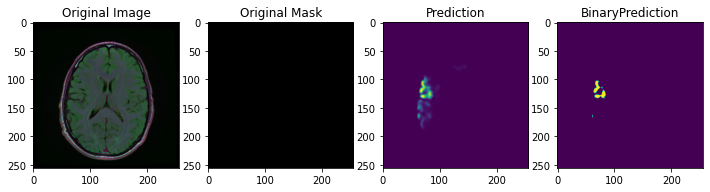

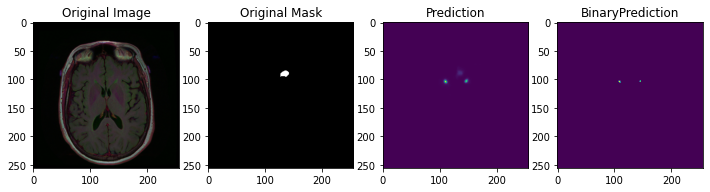

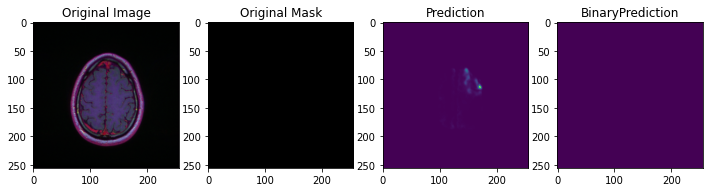

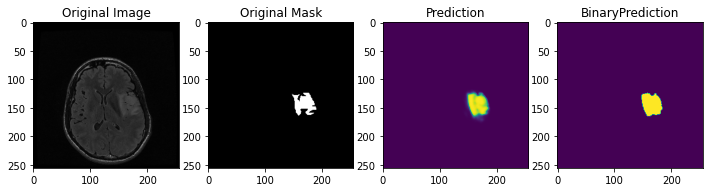

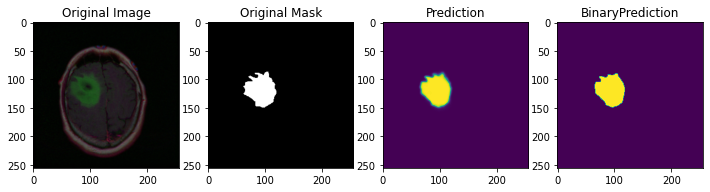

In [110]:
for i in range(30):
    idx = np.random.randint(0, len(path_to_directory))
    imagePath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['images'].iloc[idx])
    maskPath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['masks'].iloc[idx])
        
    image = (cv.imread(imagePath))
    mask = (cv.imread(maskPath))
    
    img = cv.resize(image, (256, 256), interpolation=cv.INTER_AREA)
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,4,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,4,2)
    plt.imshow(mask)
    plt.title('Original Mask')
    plt.subplot(1,4,3)
    plt.imshow(np.squeeze(pred))
    plt.title('Prediction')
    plt.subplot(1,4,4)
    plt.imshow(np.squeeze(pred) > 0.5)
    plt.title('BinaryPrediction')
    plt.show()

# Building the Model using keras model Trained Model 2

In [39]:
inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

# Defining Conv Layers

In [40]:
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs) # floation values
c1 = tf.keras.layers.Conv2D(16, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(inputs)
#kernel_initializer for initial waits he_normal is centred about 0 all the weights around the zeros
#paddind as we are using conv2d 3x3 so it will effect the boundary\edge pixel so we add extra pixels so output and input remain same
c1 = tf.keras.layers.Dropout(0.1)(c1) #10% dropout to avoid overfitting
c1 = tf.keras.layers.Conv2D(16, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(c1)
p1 = tf.keras.layers.MaxPool2D((2,2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2) #10%  dropout
c2 = tf.keras.layers.Conv2D(32, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(c2)
p2 = tf.keras.layers.MaxPool2D((2,2))(c2)

c3 = tf.keras.layers.Conv2D(64, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3) #20% dropout
c3 = tf.keras.layers.Conv2D(64, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(c3)
p3 = tf.keras.layers.MaxPool2D((2,2))(c3)

c4 = tf.keras.layers.Conv2D(128, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4) #20% dropout
c4 = tf.keras.layers.Conv2D(128, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(c4)
p4 = tf.keras.layers.MaxPool2D((2,2))(c4)


c5 = tf.keras.layers.Conv2D(256, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5) #30% dropout
c5 = tf.keras.layers.Conv2D(256, (3,3), activation= 'relu', kernel_initializer='he_normal', padding= 'same')(c5)

#Upsampling/ Expansive path

u6 = tf.keras.layers.Conv2DTranspose(128,(2,2), strides=(2,2), padding= 'same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(64,(2,2), strides=(2,2), padding= 'same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(32,(2,2), strides=(2,2), padding= 'same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(c8)


u9 = tf.keras.layers.Conv2DTranspose(16,(2,2), strides=(2,2), padding= 'same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(16, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, ( 3, 3), activation= 'relu', kernel_initializer= 'he_normal', padding= 'same')(c9)

#output layer
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation= 'sigmoid')(c9)

#model
model = tf.keras.Model(inputs=[inputs], outputs= [outputs])
model.compile(optimizer="adam", loss= 'binary_crossentropy', metrics= ['accuracy'])


# Summary of layers in our model

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 16) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        dropout[0][0]                    
______________________________________________________________________________________________

# Fitting The Model (setting check points and callbacks)

In [ ]:
#model check point
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_MRI.h5',verbose= 1, save_best_only= True)
#classback
callbacks = [tf.keras.callbacks.EarlyStopping(patience= 2, monitor= 'val_loss'),
             tf.keras.callbacks.TensorBoard(log_dir= 'logs')]
results = model.fit(train_gen, validation_data= valid_gen, batch_size= 32, epochs= 25, callbacks= callbacks)

# **U-NET Train Model 3**

# Improvment

*   Batch Normalisation- elongated loss is problem so it help to (subtract mean and dividing SD as we know so using this we can use larger learning rates as previous it was problem. ) And cost Fuction is  symmetric type and evenly spread, Its also act as regularisation. It increase speed
*  Adam Learning Rate Optimizer (LRO) can be used for adaptive learning rate optimizer as different feature will have different learning rates.





In [132]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x =  tf.keras.layers.Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
               kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x =  tf.keras.layers.BatchNormalization()(x)
    x =  tf.keras.layers.Activation('relu')(x)
    
    # second layer
    x =  tf.keras.layers.Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x =  tf.keras.layers.BatchNormalization()(x)
    x =  tf.keras.layers.Activation('relu')(x)
    
    return x

In [135]:

def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)
    p1 = tf.keras.layers.Dropout(dropout)(p1)
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
    p2 = tf.keras.layers.Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
    p3 = tf.keras.layers.Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)
    p4 = tf.keras.layers.Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    u6 = tf.keras.layers.Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    u6 = tf.keras.layers.Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u7 = tf.keras.layers.Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    u7 = tf.keras.layers.Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u8 = tf.keras.layers.Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    u8 = tf.keras.layers.Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = tf.keras.layers.Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    u9 = tf.keras.layers.Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = tf.keras.Model(inputs=[input_img], outputs=[outputs])
    return model

In [140]:
input_img = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), name='img')
model3 = get_unet(input_img, n_filters=16, dropout=0.2, batchnorm=True)
model3.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])

In [141]:
model3.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_115 (Conv2D)             (None, 256, 256, 16) 448         img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_109 (BatchN (None, 256, 256, 16) 64          conv2d_115[0][0]                 
__________________________________________________________________________________________________
activation_109 (Activation)     (None, 256, 256, 16) 0           batch_normalization_109[0][0]    
____________________________________________________________________________________________

In [142]:
#model check point
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_MRI.h5',verbose= 1, save_best_only= True)
#classback
callbacks = [tf.keras.callbacks.EarlyStopping(patience= 2, monitor= 'val_loss'),
             tf.keras.callbacks.TensorBoard(log_dir= 'logs')]

In [143]:
STEP_SIZE_TRAIN = timage_generator.n/20
STEP_SIZE_VALID = vimage_generator.n/20

In [149]:
results = model3.fit(train_gen,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    batch_size= 6,
                    epochs=25,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                   validation_steps=STEP_SIZE_VALID)

Epoch 1/25
176/176 [==============================] - 47s 254ms/step - loss: 0.0075 - accuracy: 0.9973 - val_loss: 0.0080 - val_accuracy: 0.9976
Epoch 2/25
176/176 [==============================] - 44s 251ms/step - loss: 0.0070 - accuracy: 0.9974 - val_loss: 0.0068 - val_accuracy: 0.9977
Epoch 3/25
176/176 [==============================] - 45s 255ms/step - loss: 0.0062 - accuracy: 0.9976 - val_loss: 0.0072 - val_accuracy: 0.9976
Epoch 4/25
176/176 [==============================] - 46s 258ms/step - loss: 0.0060 - accuracy: 0.9977 - val_loss: 0.0064 - val_accuracy: 0.9979
Epoch 5/25
176/176 [==============================] - 48s 271ms/step - loss: 0.0058 - accuracy: 0.9978 - val_loss: 0.0062 - val_accuracy: 0.9978
Epoch 6/25
176/176 [==============================] - 46s 261ms/step - loss: 0.0057 - accuracy: 0.9978 - val_loss: 0.0074 - val_accuracy: 0.9976
Epoch 7/25
176/176 [==============================] - 46s 259ms/step - loss: 0.0052 - accuracy: 0.9979 - val_loss: 0.0057 - val_ac

In [152]:
model3.save('/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Saved Model/MRI_IS_Model3_Batch_Nornalisation.h5')

In [153]:
# load the best model
model3.load_weights('/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/Saved Model/MRI_IS_Model3_Batch_Nornalisation.h5')

In [154]:
eval_results = model3.evaluate(valid_gen, steps=STEP_SIZE_VALID, verbose=1)

19/19 [==============================] - 3s 148ms/step - loss: 0.0088 - accuracy: 0.9972


In [155]:
DataPath = "/content/drive/MyDrive/Kaggle/Brain MRI Segmentation/kaggle_3m"


In [156]:
idx = np.random.randint(0, len(path_to_directory))
imagePath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['images'].iloc[idx])
maskPath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['masks'].iloc[idx])

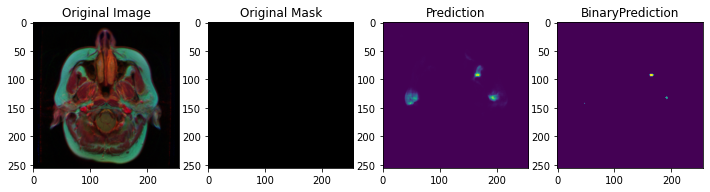

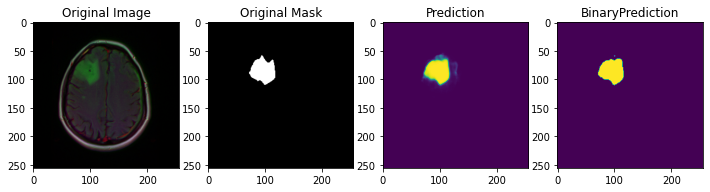

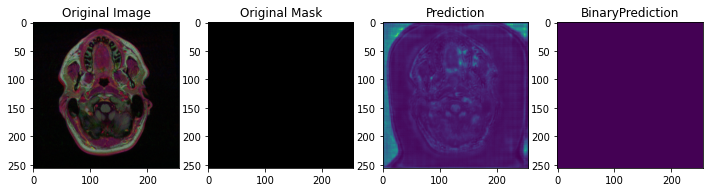

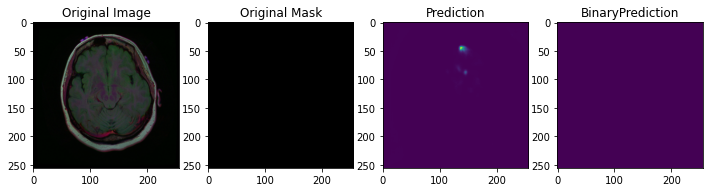

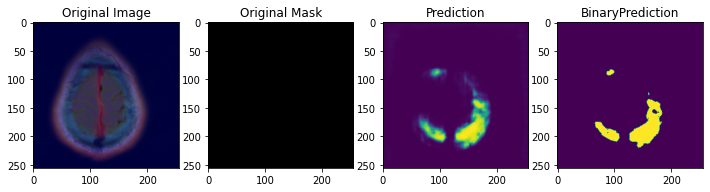

...

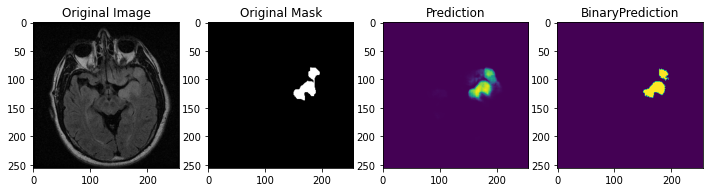

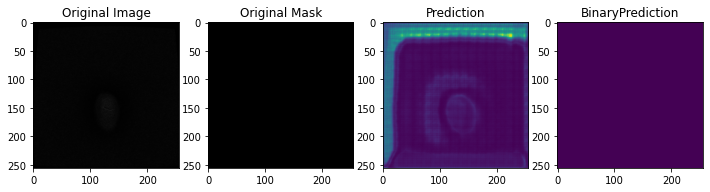

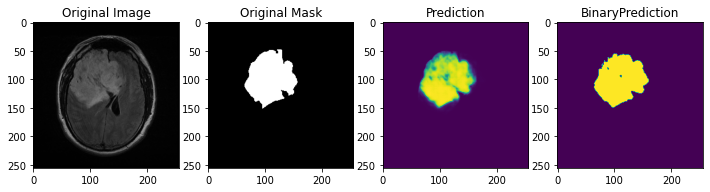

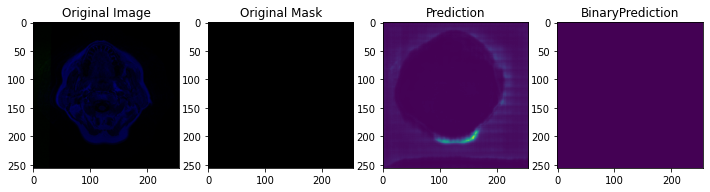

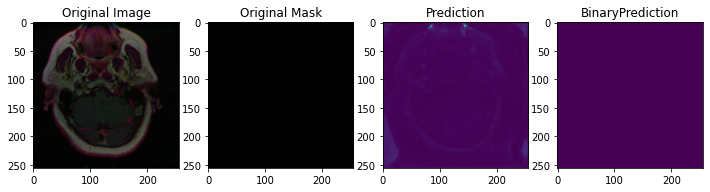

In [157]:
for i in range(30):
    idx = np.random.randint(0, len(path_to_directory))
    imagePath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['images'].iloc[idx])
    maskPath = DataPath + os.path.join(DataPath, path_to_directory['directory'].iloc[idx], path_to_directory['masks'].iloc[idx])
        
    image = (cv.imread(imagePath))
    mask = (cv.imread(maskPath))
    
    img = cv.resize(image, (256, 256), interpolation=cv.INTER_AREA)
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model3.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,4,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,4,2)
    plt.imshow(mask)
    plt.title('Original Mask')
    plt.subplot(1,4,3)
    plt.imshow(np.squeeze(pred))
    plt.title('Prediction')
    plt.subplot(1,4,4)
    plt.imshow(np.squeeze(pred) > 0.5)
    plt.title('BinaryPrediction')
    plt.show()